In [1]:
import sys 
import os 
import re 
# import requests
from bs4 import BeautifulSoup
import pandas as pd 
import numpy as np 
import os
from datetime import datetime
import matplotlib.pyplot as plt
from matplotlib import colors
from matplotlib.ticker import PercentFormatter
from pathlib import Path

# from pathlib import Path
# script_location = Path(__file__).absolute().parent
# target_directory = script_location / 'mentalLLM' / 'config.py'

sys.path.append("/Users/ngokykhanhthu/Documents/Mental_Health_n_LLMs")
from mentalLLM.config import RAW_DIR, INTERIM_DIR, PROCESSED_DIR, FINAL_DIR, DATASET, DATA_KEYWORD, CHAT_GPT_QUESTION
from chat_gpt_scraper import remove_white_spaces, is_unix_time, convert_unix_time, find_links, scrape_link, retrieve_the_json_portion, extract_json_object, create_csv_files, extract_msg

In [2]:
directory_path = Path("../data/0.raw")

file_path = directory_path / "data_4.csv"
data = pd.read_csv(file_path)


# CLEAN DATA

In [4]:
data.columns.to_list()

['StartDate',
 'EndDate',
 'Status',
 'IPAddress',
 'Progress',
 'Duration (in seconds)',
 'Finished',
 'RecordedDate',
 'ResponseId',
 'RecipientLastName',
 'RecipientFirstName',
 'RecipientEmail',
 'ExternalReference',
 'LocationLatitude',
 'LocationLongitude',
 'DistributionChannel',
 'UserLanguage',
 'Q_RecaptchaScore',
 'C_1',
 'E_1_1',
 'E_2',
 'E_3',
 'LLM_G_1',
 '1_LLM_S_1',
 '1_LLM_S_2',
 '1_LLM_S_3',
 '1_LLM_S_4_Id',
 '1_LLM_S_4_Name',
 '1_LLM_S_4_Size',
 '1_LLM_S_4_Type',
 '1_LLM_S_5_Id',
 '1_LLM_S_5_Name',
 '1_LLM_S_5_Size',
 '1_LLM_S_5_Type',
 '1_LLM_S_6_Id',
 '1_LLM_S_6_Name',
 '1_LLM_S_6_Size',
 '1_LLM_S_6_Type',
 '1_LLM_S_7',
 '1_LLM_S_7_1',
 '1_LLM_S_7_2_Id',
 '1_LLM_S_7_2_Name',
 '1_LLM_S_7_2_Size',
 '1_LLM_S_7_2_Type',
 '1_LLM_S_8',
 '1_LLM_S_9_2',
 '1_LLM_S_9_1_Id',
 '1_LLM_S_9_1_Name',
 '1_LLM_S_9_1_Size',
 '1_LLM_S_9_1_Type',
 '2_LLM_S_1',
 '2_LLM_S_2',
 '2_LLM_S_3',
 '2_LLM_S_4_Id',
 '2_LLM_S_4_Name',
 '2_LLM_S_4_Size',
 '2_LLM_S_4_Type',
 '2_LLM_S_5_Id',
 '2_LLM

In [5]:
df = data[data["DistributionChannel"] != "preview"] 

In [6]:
# pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)
pd.set_option('display.max_colwidth', None)
pd.set_option('display.max_rows', None)
pd.set_option('display.width', None)

from IPython.display import display
display(df)


StartDate  \
0                                               Start Date   
1   {"ImportId":"startDate","timeZone":"America/New_York"}   
2                                      2025-09-17 23:59:43   
3                                      2025-09-18 13:07:49   
4                                      2025-10-02 07:54:56   
7                                      2025-10-09 15:19:12   
8                                      2025-10-09 15:18:24   
10                                     2025-10-16 16:18:24   
14                                     2025-10-19 13:23:37   
15                                     2025-10-20 09:30:53   
17                                     2025-10-19 14:43:04   
18                                     2025-10-19 14:51:12   
19                                     2025-10-20 11:06:40   
20                                     2025-10-22 10:49:54   
21                                     2025-10-23 23:48:19   
22                                     2025-11-04 18:06:43   
23                                     2025-11-04 19:35:46   
24                                     2025-11-04 19:59:50   
25                                     2025-11-04 19:52:07   
26                                     2025-11-04 19:40:52   
27                                     2025-11-04 21:06:29   
28                                     2025-11-04 20:56:52   
29                                     2025-11-04 23:21:27   
30                                     2025-11-05 20:31:48   
31                                     2025-11-07 13:31:46   
32                                     2025-11-07 13:31:43   
33                                     2025-11-07 15:20:45   
34                                     2025-11-07 15:24:35   
35                                     2025-11-07 17:19:54   
36                                     2025-10-31 19:04:55   
37                                     2025-10-31 11:09:28   
38                                     2025-11-04 19:39:09   
39                                     2025-11-04 22:47:48   
40                                     2025-11-04 23:22:26   
41                                     2025-11-12 02:06:04   
42                                     2025-11-05 10:10:04   
43                                     2025-11-05 14:06:18   
44                                     2025-11-05 20:15:07   
45                                     2025-11-05 20:27:41   
46                                     2025-11-04 19:31:23   
47                                     2025-11-07 13:31:22   
48                                     2025-11-07 13:32:42   
49                                     2025-11-07 15:21:35   
50                                     2025-11-07 18:03:27   
51                                     2025-11-16 10:30:43   
53                                     2025-11-10 13:02:26   
54                                     2025-11-18 16:31:42   
55                                     2025-11-14 13:29:14   

                                                 EndDate  \
0                                               End Date   
1   {"ImportId":"endDate","timeZone":"America/New_York"}   
2                                    2025-09-18 00:03:05   
3                                    2025-09-18 13:09:46   
4                                    2025-10-02 08:01:43   
7                                    2025-10-09 15:25:07   
8                                    2025-10-09 15:42:56   
10                                   2025-10-16 16:38:02   
14                                   2025-10-19 13:39:10   
15                                   2025-10-20 09:31:59   
17                                   2025-10-19 14:50:18   
18                                   2025-10-19 15:00:15   
19                                   2025-10-20 11:07:19   
20                                   2025-10-22 10:50:36   
21                                   2025-10-23 23:49:30   
22                                   2025-11-04 18

In [7]:
# TODO manually remove the rows without any chats or incomplete responses  
# df = df.drop([0,1 ])
df = df.dropna(subset = ["1_LLM_S_1"])
df.shape[0]

# 24 valid responses 

26

# DEMOGRAPHICS

In [8]:
df["Dem_1"].value_counts()

Dem_1
Woman                                     11
Man                                        2
What is your gender? - Selected Choice     1
{"ImportId":"QID7"}                        1
Other                                      1
Name: count, dtype: int64

In [9]:
demographics = df[
    (df["Dem_1"] != '{"ImportId":"QID7"}') & 
    (df["Dem_1"] != 'What is your gender? - Selected Choice')
]["Dem_1"]

demographics.value_counts()

Dem_1
Woman    11
Man       2
Other     1
Name: count, dtype: int64

In [10]:
institution = df[
    (df["Q103"] != '{"ImportId":"QID103"}') & 
    (df["Q103"] != 'From what institution are you from? - Selected Choice')
]["Q103"]
institution.value_counts()

Q103
Mount Holyoke College    7
UMass Amherst            6
Other                    1
Name: count, dtype: int64

# Neurotype

In [11]:
df["NT_1"].value_counts() 

NT_1
Obsessive-compulsive disorder (OCD)                                                                                                                  3
Attention-Deficit/Hyperactivity Disorder (ADHD)                                                                                                      2
Do you have a diagnosis of or suspect yourself of having any of the following neurodivergent conditions? Select all that apply: - Selected Choice    1
{"ImportId":"QID69"}                                                                                                                                 1
Attention-Deficit/Hyperactivity Disorder (ADHD),Autism Spectrum Disorder (ASD)                                                                       1
Other                                                                                                                                                1
Name: count, dtype: int64

In [12]:
answers = ['Attention-Deficit/Hyperactivity Disorder (ADHD)', 'Autism Spectrum Disorder (ASD)', 
            'Dyslexia', 'Obsessive-compulsive disorder (OCD)', 'Other']


result = pd.DataFrame({
    'neurodivergent conditions': answers,
    'count': [df['NT_1'].str.contains(re.escape(answer), na=False).sum() for answer in answers]
})

result


,neurodivergent conditions,count
0,Attention-Deficit/Hyperactivity Disorder (ADHD),3
1,Autism Spectrum Disorder (ASD),1
2,Dyslexia,0
3,Obsessive-compulsive disorder (OCD),3
4,Other,1


In [13]:
df["NT_2_1"].value_counts()
# df["NT_2_1"].dtype


NT_2_1
Rarely                                                                                                                                                                                                                                                                                                                                                                        4
Sometimes                                                                                                                                                                                                                                                                                                                                                                     4
Often                                                                                                                                                                                                                                                            

In [14]:
for i in range(1,7):
    df[f'NT_2_{i}'] = df[f'NT_2_{i}'].astype('category')


In [15]:
mapping = {
    'Never': 1, 
    'Rarely': 2,
    'Sometimes': 3,
    'Often': 4, 
    # 'Never': 4, 
    'Very often': 5
}

for i in range(1,7):
    df[f'NT_2_{i}_num'] = df[f'NT_2_{i}'].map(mapping)
    df[f'NT_2_{i}_num'] = df[f'NT_2_{i}_num'].astype('float64')


In [16]:
df.head(2)

StartDate  \
0                                              Start Date   
1  {"ImportId":"startDate","timeZone":"America/New_York"}   

                                                EndDate  \
0                                              End Date   
1  {"ImportId":"endDate","timeZone":"America/New_York"}   

                  Status                 IPAddress                 Progress  \
0          Response Type                IP Address                 Progress   
1  {"ImportId":"status"}  {"ImportId":"ipAddress"}  {"ImportId":"progress"}   

     Duration (in seconds)                 Finished  \
0    Duration (in seconds)                 Finished   
1  {"ImportId":"duration"}  {"ImportId":"finished"}   

                                                RecordedDate  \
0                                              Recorded Date   
1  {"ImportId":"recordedDate","timeZone":"America/New_York"}   

                 ResponseId                 RecipientLastName  \
0               Response ID               Recipient Last Name   
1  {"ImportId":"_recordId"}  {"ImportId":"recipientLastName"}   

                  RecipientFirstName                 RecipientEmail  \
0               Recipient First Name                Recipient Email   
1  {"ImportId":"recipientFirstName"}  {"ImportId":"recipientEmail"}   

                      ExternalReference                 LocationLatitude  \
0               External Data Reference                Location Latitude   
1  {"ImportId":"externalDataReference"}  {"ImportId":"locationLatitude"}   

                  LocationLongitude                 DistributionChannel  \
0                Location Longitude                Distribution Channel   
1  {"ImportId":"locationLongitude"}  {"ImportId":"distributionChannel"}   

                  UserLanguage                 Q_RecaptchaScore  \
0                User Language                 Q_RecaptchaScore   
1  {"ImportId":"userLanguage"}  {"ImportId":"Q_RecaptchaScore"}   

                                             C_1                    E_1_1  \
0  Do you consent to the statement listed above?  What is your age? - Age   
1                            {"ImportId":"QID6"}   {"ImportId":"QID30_1"}   

                                                             E_2  \
0  Have you ever used a Large Language Model (LLM) while coding?   
1                                           {"ImportId":"QID31"}   

                                                                                                                                                                                                           E_3  \
0  Would you be willing to share at least one instance of a coding session with an LLM (e.g., ChatGPT, Claude, Cursor)?\n\n(We will provide instructions on how to find and share the link in a later section)   
1                                                                                                                                                                                         {"ImportId":"QID32"}   

                                                                                                   LLM_G_1  \
0  How many chat sessions in which you used an LLM to code would you like to upload? (Maximum: 5 sessions)   
1                                                                                {"ImportId":"QID24_TEXT"}   

                                                                       1_LLM_S_1  \
0  1 - Please select the type of LLM you used for the session you are uploading:   
1                                                         {"ImportId":"1_QID33"}   

                                                                                                                                                                                                                                                                                                                                                                                  

In [17]:
# cols = df.loc[:, 'NT_2_1':'NT_2_6']  
# df['average'] = df.loc[:, 'NT_2_1_num':'NT_2_6_num'].mean(axis=1)
df['average'] = df.loc[:, 'NT_2_1_num':'NT_2_6_num'].mean(axis=1, skipna=True)
df[df['average'].notna()].head(2)


,StartDate,EndDate,Status,IPAddress,Progress,Duration (in seconds),Finished,RecordedDate,ResponseId,RecipientLastName,RecipientFirstName,RecipientEmail,ExternalReference,LocationLatitude,LocationLongitude,DistributionChannel,UserLanguage,Q_RecaptchaScore,C_1,E_1_1,E_2,E_3,LLM_G_1,1_LLM_S_1,1_LLM_S_2,1_LLM_S_3,1_LLM_S_4_Id,1_LLM_S_4_Name,1_LLM_S_4_Size,1_LLM_S_4_Type,1_LLM_S_5_Id,1_LLM_S_5_Name,1_LLM_S_5_Size,1_LLM_S_5_Type,1_LLM_S_6_Id,1_LLM_S_6_Name,1_LLM_S_6_Size,1_LLM_S_6_Type,1_LLM_S_7,1_LLM_S_7_1,1_LLM_S_7_2_Id,1_LLM_S_7_2_Name,1_LLM_S_7_2_Size,1_LLM_S_7_2_Type,1_LLM_S_8,1_LLM_S_9_2,1_LLM_S_9_1_Id,1_LLM_S_9_1_Name,1_LLM_S_9_1_Size,1_LLM_S_9_1_Type,2_LLM_S_1,2_LLM_S_2,2_LLM_S_3,2_LLM_S_4_Id,2_LLM_S_4_Name,2_LLM_S_4_Size,2_LLM_S_4_Type,2_LLM_S_5_Id,2_LLM_S_5_Name,2_LLM_S_5_Size,2_LLM_S_5_Type,2_LLM_S_6_Id,2_LLM_S_6_Name,2_LLM_S_6_Size,2_LLM_S_6_Type,2_LLM_S_7,2_LLM_S_7_1,2_LLM_S_7_2_Id,2_LLM_S_7_2_Name,2_LLM_S_7_2_Size,2_LLM_S_7_2_Type,2_LLM_S_8,2_LLM_S_9_2,2_LLM_S_9_1_Id,2_LLM_S_9_1_Name,2_LLM_S_9_1_Size,2_LLM_S_9_1_Type,3_LLM_S_1,3_LLM_S_2,3_LLM_S_3,3_LLM_S_4_Id,3_LLM_S_4_Name,3_LLM_S_4_Size,3_LLM_S_4_Type,3_LLM_S_5_Id,3_LLM_S_5_Name,3_LLM_S_5_Size,3_LLM_S_5_Type,3_LLM_S_6_Id,3_LLM_S_6_Name,3_LLM_S_6_Size,3_LLM_S_6_Type,3_LLM_S_7,3_LLM_S_7_1,3_LLM_S_7_2_Id,3_LLM_S_7_2_Name,3_LLM_S_7_2_Size,3_LLM_S_7_2_Type,3_LLM_S_8,3_LLM_S_9_2,3_LLM_S_9_1_Id,3_LLM_S_9_1_Name,3_LLM_S_9_1_Size,3_LLM_S_9_1_Type,4_LLM_S_1,4_LLM_S_2,4_LLM_S_3,4_LLM_S_4_Id,4_LLM_S_4_Name,4_LLM_S_4_Size,4_LLM_S_4_Type,4_LLM_S_5_Id,4_LLM_S_5_Name,4_LLM_S_5_Size,4_LLM_S_5_Type,4_LLM_S_6_Id,4_LLM_S_6_Name,4_LLM_S_6_Size,4_LLM_S_6_Type,4_LLM_S_7,4_LLM_S_7_1,4_LLM_S_7_2_Id,4_LLM_S_7_2_Name,4_LLM_S_7_2_Size,4_LLM_S_7_2_Type,4_LLM_S_8,4_LLM_S_9_2,4_LLM_S_9_1_Id,4_LLM_S_9_1_Name,4_LLM_S_9_1_Size,4_LLM_S_9_1_Type,5_LLM_S_1,5_LLM_S_2,5_LLM_S_3,5_LLM_S_4_Id,5_LLM_S_4_Name,5_LLM_S_4_Size,5_LLM_S_4_Type,5_LLM_S_5_Id,5_LLM_S_5_Name,5_LLM_S_5_Size,5_LLM_S_5_Type,5_LLM_S_6_Id,5_LLM_S_6_Name,5_LLM_S_6_Size,5_LLM_S_6_Type,5_LLM_S_7,5_LLM_S_7_1,5_LLM_S_7_2_Id,5_LLM_S_7_2_Name,5_LLM_S_7_2_Size,5_LLM_S_7_2_Type,5_LLM_S_8,5_LLM_S_9_2,5_LLM_S_9_1_Id,5_LLM_S_9_1_Name,5_LLM_S_9_1_Size,5_LLM_S_9_1_Type,LLM_S_10,LLM_S_11_1,LLM_S_12_1,LLM_S_12_2,LLM_S_12_3,LLM_S_12_4,LLM_S_12_5,LLM_S_12_6,LLM_S_12_7,LLM_S_12_8,LLM_S_14,PG_G_3_1_1,PG_G_3_1_2,PG_G_3_1_3,PG_G_3_1_4,PG_G_3_1_5,PG_G_3_1_6,PG_G_3_2_1,PG_G_3_2_2,PG_G_3_2_3,PG_G_3_2_4,PG_G_3_2_5,PG_G_3_3_1,PG_G_3_3_2,PG_G_3_3_3,PG_G_3_3_4,PG_G_3_3_5,PG_G_3_3_6,PG_G_3_4_1,PG_G_3_4_2,PG_G_3_4_3,PG_G_2_1,PG_G_4,PG_G_3_5,PG_G_6,PG_G_7,PG_G_8,PG_G_9,PG_P_1,PG_P_1_3_TEXT,Q106,PG_P_2,PG_UC_1,PG_UC_3_1,PG_UC_3_2,PG_UC_3_3,PG_UC_3_4,PG_UC_3_5,PG_UC_3_6,PMH_1,PMH_1_7_TEXT,PMH_3_1,PMH_3_2,PMH_3_3,PMH_3_4,PMH_3_5,PMH_3_6,PMH_3_7,PMH_3_8,PMH_3_9,NT_1,NT_1_5_TEXT,NT_2_1,NT_2_2,NT_2_3,NT_2_4,NT_2_5,NT_2_6,Dem_1,Dem_1_3_TEXT,Q103,Q103_7_TEXT,Logistics_1,Logistics_2,NT_2_1_num,NT_2_2_num,NT_2_3_num,NT_2_4_num,NT_2_5_num,NT_2_6_num,average
7,2025-10-09 15:19:12,2025-10-09 15:25:07,IP Address,128.119.40.196,100,355,True,2025-10-09 15:25:08,R_7r66f248sUNycSJ,NaN,NaN,NaN,NaN,42.3654,-72.4671,anonymous,EN,1,I agree,23,Yes,Yes,1,ChatGPT,https://chatgpt.com/share/68e80b00-f5b0-8013-a344-6aaccceb8336,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,No,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,"Generate code,Find the solution to a coding task,Optimise code",10,Strongly agree,Strongly agree,Somewhat agree,Somewhat disagree,Somewhat disagree,Strongly agree,Somewhat disagree,Somewhat agree,NaN,Strongly agree,Strongly agree,Strongly agree,Strongly

In [18]:
col =  df[df['average'].notna()]['average'].values 
type(col)

numpy.ndarray

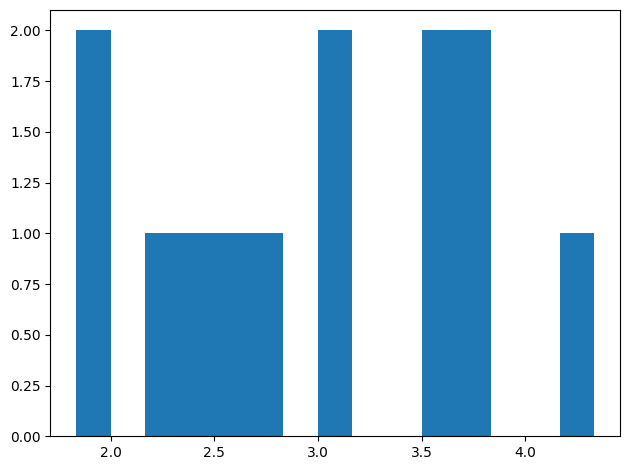

In [19]:
fig, axs = plt.subplots(1, 1, sharey=True, tight_layout=True)
axs.hist(col, bins=15)

plt.show()

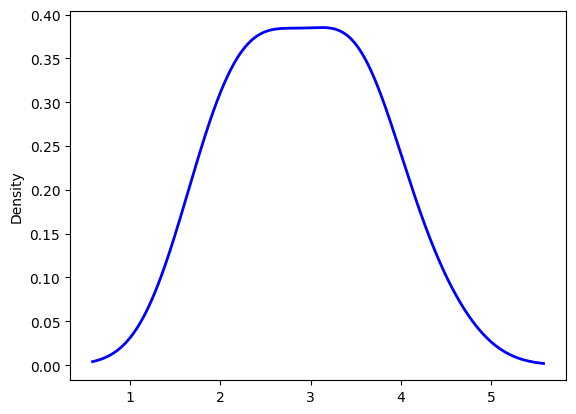

In [20]:
df[df['average'].notna()]['average'].plot.density(bw_method='scott', color='blue', linestyle='-', linewidth=2)
plt.show()